In [175]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import statsmodels.api
from plotly import express as px
from scipy import stats
from sklearn.ensemble import RandomForestClassifier  
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer, make_column_transformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,mean_squared_error, r2_score
from xgboost import XGBRegressor
import sys
import io
from mpl_toolkits.mplot3d import Axes3D
from sklearn.tree import export_graphviz
import pydot
import graphviz
from sklearn.metrics import accuracy_score
from sklearn import metrics, tree


In [2]:
# souce code : https://developer.ibm.com/tutorials/learn-regression-algorithms-using-python-and-scikit-learn/
def two_d_compare(X_test,y_test,y_pred,model_name):
    area = (12 * np.random.rand(40))**2 
    plt.subplots(ncols=2, figsize=(10,4))
    plt.suptitle('Actual vs Predicted data : ' +model_name + '. Variance score: %.2f' % r2_score(y_test, y_pred))

    plt.subplot(121)
    plt.scatter(X_test, y_test, alpha=0.8, color='#8CCB9B')
    plt.title('Actual')

    plt.subplot(122)
    plt.scatter(X_test, y_pred,alpha=0.8, color='#E5E88B')
    plt.title('Predicted')

    plt.show()
    

def model_metrics(regressor,y_test,y_pred):
    mse = mean_squared_error(y_test,y_pred)
    print("Mean squared error: %.2f"
      % mse)
    r2 = r2_score(y_test, y_pred)
    print('R2 score: %.2f' % r2 )
    return [mse, r2]

def two_vs_three(x_test,y_test,y_pred,z=None, isLinear = False) : 
    
    area = 60
    

    fig = plt.figure(figsize=(12,6))
    fig.suptitle('2D and 3D view of price data')

    # First subplot
    ax = fig.add_subplot(1, 2,1)
    ax.scatter(x_test, y_test, alpha=0.5,color='blue', s= area)
    ax.plot(x_test, y_pred, alpha=0.9,color='red', linewidth=2)
    ax.set_xlabel('availability_365')
    ax.set_ylabel('PRICE')
    # plt.xlim(0, 500)
    # plt.ylim(0, 5000)
    plt.title('availability_365 vs PRICE')
    
    if not isLinear : 
    # Second subplot
        ax = fig.add_subplot(1,2,2, projection='3d')

        ax.scatter(z, x_test, y_test, color='blue', marker='o')
        ax.plot(z, x_test, y_pred, alpha=0.9,color='red', linewidth=2)
        ax.set_ylabel('availability_365')
        ax.set_zlabel('PRICE')
        ax.set_xlabel('host_total_listings_count')

    plt.title('host_total_listings_count vs availability_365 vs PRICE')

    plt.show()

In [3]:
 def cat_cont_correlation_ratio(categories, values):
        """
        Correlation Ratio: https://en.wikipedia.org/wiki/Correlation_ratio
        SOURCE:
        1.) https://towardsdatascience.com/the-search-for-categorical-correlation-a1cf7f1888c9  # noqa
        :param categories: Numpy array of categories
        :param values: Numpy array of values
        :return: correlation
        """
        f_cat, _ = pd.factorize(categories)
        cat_num = np.max(f_cat) + 1
        y_avg_array = np.zeros(cat_num)
        n_array = np.zeros(cat_num)
        for i in range(0, cat_num):
            cat_measures = values[np.argwhere(f_cat == i).flatten()]
            n_array[i] = len(cat_measures)
            y_avg_array[i] = np.average(cat_measures)
        y_total_avg = np.sum(np.multiply(y_avg_array, n_array)) / np.sum(
            n_array
        )  # noqa
        numerator = np.sum(
            np.multiply(
                n_array, np.power(np.subtract(y_avg_array, y_total_avg), 2)
            )  # noqa
        )
        denominator = np.sum(np.power(np.subtract(values, y_total_avg), 2))
        if numerator == 0:
            eta = 0.0
        else:
            eta = np.sqrt(numerator / denominator)
        return eta

In [4]:
def cat_correlation(x, y, bias_correction=True, tschuprow=False):
    """
    Calculates correlation statistic for categorical-categorical association. # noqa
    The two measures supported are:
    1. Cramer'V ( default )
    2. Tschuprow'T

    SOURCES:
    1.) CODE: https://github.com/MavericksDS/pycorr
    2.) Used logic from:
        https://stackoverflow.com/questions/20892799/using-pandas-calculate-cram%C3%A9rs-coefficient-matrix
        to ignore yates correction factor on 2x2
    3.) Haven't validated Tschuprow

    Bias correction and formula's taken from : https://www.researchgate.net/publication/270277061_A_bias-correction_for_Cramer's_V_and_Tschuprow's_T # noqa

    Wikipedia for Cramer's V: https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V # noqa
    Wikipedia for Tschuprow' T: https://en.wikipedia.org/wiki/Tschuprow%27s_T # noqa
    Parameters:
    -----------
    x : list / ndarray / Pandas Series
        A sequence of categorical measurements
    y : list / NumPy ndarray / Pandas Series
        A sequence of categorical measurements
    bias_correction : Boolean, default = True
    tschuprow : Boolean, default = False
               For choosing Tschuprow as measure
    Returns:
    --------
    float in the range of [0,1]
    """
    corr_coeff = np.nan
    try:
        # x, y = fill_na(x), fill_na(y)
        crosstab_matrix = pd.crosstab(x, y)
        n_observations = crosstab_matrix.sum().sum()

        yates_correct = True
        if bias_correction:
            if crosstab_matrix.shape == (2, 2):
                yates_correct = False

        chi2, _, _, _ = stats.chi2_contingency(
            crosstab_matrix, correction=yates_correct
        )
        phi2 = chi2 / n_observations

        # r and c are number of categories of x and y
        r, c = crosstab_matrix.shape
        if bias_correction:
            phi2_corrected = max(
                0, phi2 - ((r - 1) * (c - 1)) / (n_observations - 1)
            )
            r_corrected = r - ((r - 1) ** 2) / (n_observations - 1)
            c_corrected = c - ((c - 1) ** 2) / (n_observations - 1)
            if tschuprow:
                corr_coeff = np.sqrt(
                    phi2_corrected
                    / np.sqrt((r_corrected - 1) * (c_corrected - 1))  # noqa
                )
                return corr_coeff
            corr_coeff = np.sqrt(
                phi2_corrected / min((r_corrected - 1), (c_corrected - 1))
            )
            return corr_coeff
        if tschuprow:
            corr_coeff = np.sqrt(phi2 / np.sqrt((r - 1) * (c - 1)))
            return corr_coeff
        corr_coeff = np.sqrt(phi2 / min((r - 1), (c - 1)))
        return corr_coeff
    except Exception as ex:
        print(ex)
        if tschuprow:
            warnings.warn("Error calculating Tschuprow's T", RuntimeWarning)  # noqa
        else:
            warnings.warn("Error calculating Cramer's V", RuntimeWarning)
        return corr_coeff

In [5]:
def plot_feature_importance(importance,names,model_type):
    # souece https://www.analyseup.com/learn-python-for-data-science/python-random-forest-feature-importance-plot.html
    #Create arrays from feature importance and feature names
    feature_importance = np.array(importance)
    feature_names = np.array(names)

    #Create a DataFrame using a Dictionary
    data={'feature_names':feature_names,'feature_importance':feature_importance}
    fi_df = pd.DataFrame(data)

    #Sort the DataFrame in order decreasing feature importance
    fi_df.sort_values(by=['feature_importance'], ascending=False,inplace=True)

    #Define size of bar plot
    plt.figure(figsize=(10,8))
    #Plot Searborn bar chart
    sns.barplot(x=fi_df['feature_importance'], y=fi_df['feature_names'])
    #Add chart labels
    plt.title(model_type + 'FEATURE IMPORTANCE')
    plt.xlabel('FEATURE IMPORTANCE')
    plt.ylabel('FEATURE NAMES')

In [87]:
combined = pd.read_csv("https://raw.githubusercontent.com/alex31425/GEOG594-MTHuang/master/combined.csv")
combined.drop(['host_id'],axis=1,inplace=True)
objcolumn = combined.dtypes[combined.dtypes == object]
objcolumn = list(objcolumn.index)
combined = pd.get_dummies(combined, columns=objcolumn)
combined = combined.dropna()
combined.head()

,price,number_of_reviews,calculated_host_listings_count,availability_365,host_since_days,host_total_listings_count,accommodates,bathrooms,bedrooms,beds,...,host_is_superhost_f,host_is_superhost_t,host_has_profile_pic_f,host_has_profile_pic_t,host_identity_verified_f,host_identity_verified_t,instant_bookable_f,instant_bookable_t,govermentIdentification_no,govermentIdentification_yes
0,161,0,1,89,1396,1.0,2,1.0,1.0,1.0,...,1,0,0,1,1,0,1,0,1,0
1,39,16,5,0,1217,5.0,1,1.0,1.0,1.0,...,1,0,0,1,1,0,1,0,1,0
2,39,1,1,87,728,1.0,4,15.0,2.0,1.0,...,1,0,0,1,0,1,0,1,0,1
3,55,5,2,0,2544,2.0,2,1.0,1.0,1.0,...,1,0,0,1,0,1,1,0,0,1
4,55,8,2,0,2544,2.0,1,1.0,1.0,1.0,...,1,0,0,1,0,1,1,0,0,1


In [48]:
combined.columns

Index(['price', 'number_of_reviews', 'calculated_host_listings_count',
       'availability_365', 'host_since_days', 'host_total_listings_count',
       'accommodates', 'bathrooms', 'bedrooms', 'beds', 'avg_rm',
       'availability_30', 'availability_60', 'availability_90',
       'number_of_reviews_ltm', 'NumberOfVerfication', 'numberofamentities',
       'host_is_superhost_f', 'host_is_superhost_t', 'host_has_profile_pic_f',
       'host_has_profile_pic_t', 'host_identity_verified_f',
       'host_identity_verified_t', 'instant_bookable_f', 'instant_bookable_t',
       'govermentIdentification_no', 'govermentIdentification_yes'],
      dtype='object')

d:\python\lib\site-packages\seaborn\distributions.py:2551: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



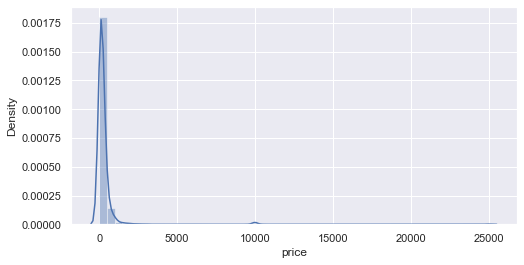

In [49]:
sns.set(rc={"figure.figsize": (8, 4)})
ax = sns.distplot(combined['price'])
plt.show()

In [50]:
print("The dataset contains columns of the following data types : \n" +str(combined.dtypes))

The dataset contains columns of the following data types : 
price                               int64
number_of_reviews                   int64
calculated_host_listings_count      int64
availability_365                    int64
host_since_days                     int64
host_total_listings_count         float64
accommodates                        int64
bathrooms                         float64
bedrooms                          float64
beds                              float64
avg_rm                            float64
availability_30                     int64
availability_60                     int64
availability_90                     int64
number_of_reviews_ltm               int64
NumberOfVerfication                 int64
numberofamentities                  int64
host_is_superhost_f                 uint8
host_is_superhost_t                 uint8
host_has_profile_pic_f              uint8
host_has_profile_pic_t              uint8
host_identity_verified_f            uint8
host_identity_ve

In [63]:
for col in combined:
    combined[col] = combined[col].astype('float64')

In [64]:
combined.dtypes

price                             float64
number_of_reviews                 float64
calculated_host_listings_count    float64
availability_365                  float64
host_since_days                   float64
host_total_listings_count         float64
accommodates                      float64
bathrooms                         float64
bedrooms                          float64
beds                              float64
avg_rm                            float64
availability_30                   float64
availability_60                   float64
availability_90                   float64
number_of_reviews_ltm             float64
NumberOfVerfication               float64
numberofamentities                float64
host_is_superhost_f               float64
host_is_superhost_t               float64
host_has_profile_pic_f            float64
host_has_profile_pic_t            float64
host_identity_verified_f          float64
host_identity_verified_t          float64
instant_bookable_f                

In [65]:
print("The dataset contains following number of records for each of the columns : \n" +str(combined.count()))

The dataset contains following number of records for each of the columns : 
price                             12150
number_of_reviews                 12150
calculated_host_listings_count    12150
availability_365                  12150
host_since_days                   12150
host_total_listings_count         12150
accommodates                      12150
bathrooms                         12150
bedrooms                          12150
beds                              12150
avg_rm                            12150
availability_30                   12150
availability_60                   12150
availability_90                   12150
number_of_reviews_ltm             12150
NumberOfVerfication               12150
numberofamentities                12150
host_is_superhost_f               12150
host_is_superhost_t               12150
host_has_profile_pic_f            12150
host_has_profile_pic_t            12150
host_identity_verified_f          12150
host_identity_verified_t          12150
inst

In [66]:
combined.isnull().any()

price                             False
number_of_reviews                 False
calculated_host_listings_count    False
availability_365                  False
host_since_days                   False
host_total_listings_count         False
accommodates                      False
bathrooms                         False
bedrooms                          False
beds                              False
avg_rm                            False
availability_30                   False
availability_60                   False
availability_90                   False
number_of_reviews_ltm             False
NumberOfVerfication               False
numberofamentities                False
host_is_superhost_f               False
host_is_superhost_t               False
host_has_profile_pic_f            False
host_has_profile_pic_t            False
host_identity_verified_f          False
host_identity_verified_t          False
instant_bookable_f                False
instant_bookable_t                False


In [67]:
combined

,price,number_of_reviews,calculated_host_listings_count,availability_365,host_since_days,host_total_listings_count,accommodates,bathrooms,bedrooms,beds,...,host_is_superhost_f,host_is_superhost_t,host_has_profile_pic_f,host_has_profile_pic_t,host_identity_verified_f,host_identity_verified_t,instant_bookable_f,instant_bookable_t,govermentIdentification_no,govermentIdentification_yes
0,161.0,0.0,1.0,89.0,1396.0,1.0,2.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
1,39.0,16.0,5.0,0.0,1217.0,5.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
2,39.0,1.0,1.0,87.0,728.0,1.0,4.0,15.0,2.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
3,55.0,5.0,2.0,0.0,2544.0,2.0,2.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0
4,55.0,8.0,2.0,0.0,2544.0,2.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12220,995.0,21.0,171.0,290.0,1560.0,173.0,8.0,3.0,4.0,4.0,...,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0
12221,995.0,1.0,9.0,342.0,202.0,9.0,16.0,5.0,6.0,12.0,...,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0
12222,49.0,55.0,1.0,156.0,2095.0,2.0,2.0,1.0,1.0,1.0,...,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0
12223,55.0,172.0,1.0,21.0,1585.0,1.0,2.0,1.0,1.0,1.0,...,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0


 ## Data preparation

In [68]:
df_combined = pd.DataFrame.from_records(combined.values)

X = df_combined.iloc[:, 1:].to_numpy()
y = df_combined.iloc[:, 0].to_numpy()
f = list(combined.columns)
f.remove('price')
df_combined.head()

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,161.0,0.0,1.0,89.0,1396.0,1.0,2.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
1,39.0,16.0,5.0,0.0,1217.0,5.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
2,39.0,1.0,1.0,87.0,728.0,1.0,4.0,15.0,2.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
3,55.0,5.0,2.0,0.0,2544.0,2.0,2.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0
4,55.0,8.0,2.0,0.0,2544.0,2.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0


In [69]:
# Determine if response is continuous or boolean

if y.dtype is str or bool is True:
    response_type = "boolean"
    print("---Response is boolean---")
elif np.unique(y).size < 5:
    response_type = "boolean"
    print("---Response is boolean---")
else:
    response_type = "continuous"
    print("---Response is continuous---")

---Response is continuous---


In [71]:
# Determine if the predictor continuous or boolean &
# create plots for each variable type
predictor_type = []
con_array = np.array([])
cat_array = np.array([])
for idx, column in enumerate(X.T):

    feature_name = f[idx]
    predictor = statsmodels.api.add_constant(column)

    # Get the stats & plot

    if np.unique(X.T[idx]).size < 5:
        v_type = "boolean"
        cat_array = np.append(cat_array, column)
        print(f[idx], "is boolean" )
        if response_type == "continuous":

            logistic_regression_model = statsmodels.api.GLM(y, predictor)
            logistic_regression_model_fitted = (
                logistic_regression_model.fit()
            )  # noqa
            print(f"Variable: {feature_name}")
            print(logistic_regression_model_fitted.summary(), '\n')
            t_value = round(logistic_regression_model_fitted.tvalues[1], 6)
            p_value = "{:.6e}".format(
                logistic_regression_model_fitted.pvalues[1]
            )  # noqa

            # Categorical Predictor by Continuous Response

            fig = px.histogram(x=column, y=y, histfunc="count")
            fig.update_layout(
                title=f"Variable: {feature_name}: (t-value={t_value}) (p-value={p_value})",  # noqa
                xaxis_title=f"Variable: {feature_name}",
                yaxis_title="Response",
            )
            fig.show()

        else:

            logistic_regression_model = statsmodels.api.GLM(y, predictor)
            logistic_regression_model_fitted = (
                logistic_regression_model.fit()
            )  # noqa
            print(f"Variable: {feature_name}")
            print(logistic_regression_model_fitted.summary(), '\n')
            t_value = round(logistic_regression_model_fitted.tvalues[1], 6)
            p_value = "{:.6e}".format(
                logistic_regression_model_fitted.pvalues[1]
            )  # noqa

            # Categorical Predictor by Continuous Response

            fig = px.scatter(x=column, y=y)
            fig.update_layout(
                title=f"Variable: {feature_name}: (t-value={t_value}) (p-value={p_value})",  # noqa
                xaxis_title=f"Variable: {feature_name}",
                yaxis_title="y",
            )
            fig.show()
    else:
        print(f[idx], "is continuous")
        v_type = "continuous"
        con_array = np.append(cat_array, column)  # noqa
        if response_type == "continuous":

            linear_regression_model = statsmodels.api.OLS(y, predictor)
            linear_regression_model_fitted = linear_regression_model.fit()
            print(f"Variable: {feature_name}")
            print(linear_regression_model_fitted.summary(), '\n')
            t_value = round(linear_regression_model_fitted.tvalues[1], 6)
            p_value = "{:.6e}".format(
                linear_regression_model_fitted.pvalues[1]
            )  # noqa

            # Continuous Predictor by Continuous Response
            # Plot the figure
            fig = px.scatter(x=column, y=y)
            fig.update_layout(
                title=f"Variable: {feature_name}: (t-value={t_value}) (p-value={p_value})",  # noqa
                xaxis_title=f"Variable: {feature_name}",
                yaxis_title="y",
            )
            fig.show()
        else:
            linear_regression_model = statsmodels.api.OLS(y, predictor)
            linear_regression_model_fitted = linear_regression_model.fit()
            print(f"Variable: {feature_name}")
            print(linear_regression_model_fitted.summary(), '\n')
            t_value = round(linear_regression_model_fitted.tvalues[1], 6)
            p_value = "{:.6e}".format(
                linear_regression_model_fitted.pvalues[1]
            )  # noqa
            # Continuous Predictor by Categorical Response
            # Plot the figure
            fig = px.histogram(x=column, y=y)
            fig.update_layout(
                title=f"Variable: {feature_name}: (t-value={t_value}) (p-value={p_value})",  # noqa
                xaxis_title=f"Variable: {feature_name}",
                yaxis_title="y",
            )
            fig.show()
    # create a list of each variable type
    predictor_type.append(v_type)
pd_PT = pd.DataFrame(predictor_type, columns=["type"])


number_of_reviews is continuous
Variable: number_of_reviews
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     65.03
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           8.07e-16
Time:                        19:35:53   Log-Likelihood:            -1.0286e+05
No. Observations:               12150   AIC:                         2.057e+05
Df Residuals:                   12148   BIC:                         2.057e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

calculated_host_listings_count is continuous
Variable: calculated_host_listings_count
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.069
Model:                            OLS   Adj. R-squared:                  0.069
Method:                 Least Squares   F-statistic:                     897.3
Date:                Sat, 12 Dec 2020   Prob (F-statistic):          2.84e-190
Time:                        19:35:53   Log-Likelihood:            -1.0246e+05
No. Observations:               12150   AIC:                         2.049e+05
Df Residuals:                   12148   BIC:                         2.049e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------

availability_365 is continuous
Variable: availability_365
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     9.979
Date:                Sat, 12 Dec 2020   Prob (F-statistic):            0.00159
Time:                        19:35:53   Log-Likelihood:            -1.0289e+05
No. Observations:               12150   AIC:                         2.058e+05
Df Residuals:                   12148   BIC:                         2.058e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------

host_since_days is continuous
Variable: host_since_days
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     29.92
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           4.58e-08
Time:                        19:35:54   Log-Likelihood:            -1.0288e+05
No. Observations:               12150   AIC:                         2.058e+05
Df Residuals:                   12148   BIC:                         2.058e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

host_total_listings_count is continuous
Variable: host_total_listings_count
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.030
Model:                            OLS   Adj. R-squared:                  0.029
Method:                 Least Squares   F-statistic:                     369.6
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           3.61e-81
Time:                        19:35:54   Log-Likelihood:            -1.0271e+05
No. Observations:               12150   AIC:                         2.054e+05
Df Residuals:                   12148   BIC:                         2.054e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------

accommodates is continuous
Variable: accommodates
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.025
Model:                            OLS   Adj. R-squared:                  0.025
Method:                 Least Squares   F-statistic:                     310.9
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           9.73e-69
Time:                        19:35:54   Log-Likelihood:            -1.0274e+05
No. Observations:               12150   AIC:                         2.055e+05
Df Residuals:                   12148   BIC:                         2.055e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
co

bathrooms is continuous
Variable: bathrooms
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     96.05
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           1.36e-22
Time:                        19:35:54   Log-Likelihood:            -1.0284e+05
No. Observations:               12150   AIC:                         2.057e+05
Df Residuals:                   12148   BIC:                         2.057e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const   

bedrooms is continuous
Variable: bedrooms
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.021
Method:                 Least Squares   F-statistic:                     257.0
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           2.99e-57
Time:                        19:35:54   Log-Likelihood:            -1.0276e+05
No. Observations:               12150   AIC:                         2.055e+05
Df Residuals:                   12148   BIC:                         2.055e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const     

beds is continuous
Variable: beds
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.020
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     242.4
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           3.98e-54
Time:                        19:35:55   Log-Likelihood:            -1.0277e+05
No. Observations:               12150   AIC:                         2.055e+05
Df Residuals:                   12148   BIC:                         2.056e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        124.0

avg_rm is continuous
Variable: avg_rm
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.014
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     174.6
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           1.40e-39
Time:                        19:35:55   Log-Likelihood:            -1.0280e+05
No. Observations:               12150   AIC:                         2.056e+05
Df Residuals:                   12148   BIC:                         2.056e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        2

availability_30 is continuous
Variable: availability_30
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     11.08
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           0.000875
Time:                        19:35:55   Log-Likelihood:            -1.0289e+05
No. Observations:               12150   AIC:                         2.058e+05
Df Residuals:                   12148   BIC:                         2.058e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

availability_60 is continuous
Variable: availability_60
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     14.59
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           0.000134
Time:                        19:35:55   Log-Likelihood:            -1.0288e+05
No. Observations:               12150   AIC:                         2.058e+05
Df Residuals:                   12148   BIC:                         2.058e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

availability_90 is continuous
Variable: availability_90
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     13.67
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           0.000218
Time:                        19:35:55   Log-Likelihood:            -1.0288e+05
No. Observations:               12150   AIC:                         2.058e+05
Df Residuals:                   12148   BIC:                         2.058e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------

number_of_reviews_ltm is continuous
Variable: number_of_reviews_ltm
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     23.93
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           1.01e-06
Time:                        19:35:56   Log-Likelihood:            -1.0288e+05
No. Observations:               12150   AIC:                         2.058e+05
Df Residuals:                   12148   BIC:                         2.058e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

NumberOfVerfication is continuous
Variable: NumberOfVerfication
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.010
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     126.6
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           3.14e-29
Time:                        19:35:56   Log-Likelihood:            -1.0283e+05
No. Observations:               12150   AIC:                         2.057e+05
Df Residuals:                   12148   BIC:                         2.057e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------

numberofamentities is continuous
Variable: numberofamentities
                            OLS Regression Results                            
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     22.62
Date:                Sat, 12 Dec 2020   Prob (F-statistic):           2.00e-06
Time:                        19:35:56   Log-Likelihood:            -1.0288e+05
No. Observations:               12150   AIC:                         2.058e+05
Df Residuals:                   12148   BIC:                         2.058e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------

host_is_superhost_f is boolean
Variable: host_is_superhost_f
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3187e+06
Method:                          IRLS   Log-Likelihood:            -1.0285e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.6020e+10
Time:                        19:35:56   Pearson chi2:                 1.60e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------

host_is_superhost_t is boolean
Variable: host_is_superhost_t
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3187e+06
Method:                          IRLS   Log-Likelihood:            -1.0285e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.6020e+10
Time:                        19:35:56   Pearson chi2:                 1.60e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------

host_has_profile_pic_f is boolean
Variable: host_has_profile_pic_f
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3279e+06
Method:                          IRLS   Log-Likelihood:            -1.0289e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.6131e+10
Time:                        19:35:56   Pearson chi2:                 1.61e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------

host_has_profile_pic_t is boolean
Variable: host_has_profile_pic_t
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3279e+06
Method:                          IRLS   Log-Likelihood:            -1.0289e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.6131e+10
Time:                        19:35:57   Pearson chi2:                 1.61e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------

host_identity_verified_f is boolean
Variable: host_identity_verified_f
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3256e+06
Method:                          IRLS   Log-Likelihood:            -1.0288e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.6104e+10
Time:                        19:35:57   Pearson chi2:                 1.61e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------

host_identity_verified_t is boolean
Variable: host_identity_verified_t
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3256e+06
Method:                          IRLS   Log-Likelihood:            -1.0288e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.6104e+10
Time:                        19:35:57   Pearson chi2:                 1.61e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------

instant_bookable_f is boolean
Variable: instant_bookable_f
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3159e+06
Method:                          IRLS   Log-Likelihood:            -1.0284e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.5985e+10
Time:                        19:35:57   Pearson chi2:                 1.60e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------

instant_bookable_t is boolean
Variable: instant_bookable_t
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3159e+06
Method:                          IRLS   Log-Likelihood:            -1.0284e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.5985e+10
Time:                        19:35:57   Pearson chi2:                 1.60e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------

govermentIdentification_no is boolean
Variable: govermentIdentification_no
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3220e+06
Method:                          IRLS   Log-Likelihood:            -1.0286e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.6059e+10
Time:                        19:35:57   Pearson chi2:                 1.61e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------

govermentIdentification_yes is boolean
Variable: govermentIdentification_yes
                 Generalized Linear Model Regression Results                  
Dep. Variable:                      y   No. Observations:                12150
Model:                            GLM   Df Residuals:                    12148
Model Family:                Gaussian   Df Model:                            1
Link Function:               identity   Scale:                      1.3220e+06
Method:                          IRLS   Log-Likelihood:            -1.0286e+05
Date:                Sat, 12 Dec 2020   Deviance:                   1.6059e+10
Time:                        19:35:58   Pearson chi2:                 1.61e+10
No. Iterations:                     3                                         
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------

In [72]:
# Split dataset predictors between categoricals and continuous
pd_PT = pd.DataFrame(predictor_type, columns=["type"])
pd_PT["name"] = f

df_PT_c = (
    pd_PT[pd_PT["type"] == "continuous"].drop(["type"], axis=1)
).copy()  # noqa
df_PT_b = (pd_PT[pd_PT["type"] == "boolean"].drop(["type"], axis=1)).copy()
pd_PT = pd_PT.drop(["type"], axis=1)
con_list = df_PT_c["name"].to_list()
cat_list = df_PT_b["name"].to_list()
f_list = pd_PT["name"].to_list()
corr_plot = {}
df_con_cat = (pd.DataFrame(X)).T
df_con_cat["type"] = predictor_type
df_con_cat["Feature"] = f

df_con = df_con_cat[df_con_cat["type"] == "continuous"]
df_cat = df_con_cat[df_con_cat["type"] == "boolean"]
df_con_d = df_con.drop(["type"], axis=1).T
df_cat_d = df_cat.drop(["type"], axis=1).T
df_con_cat_d = df_con_cat.drop(["type"], axis=1).T

df_con_cat_d.columns = df_con_cat_d.loc["Feature"]
df_con_cat_d = df_con_cat_d.drop(["Feature"])
df_con_d.columns = df_con_d.loc["Feature"]
df_cat_d.columns = df_cat_d.loc["Feature"]
df_con_d = df_con_d.drop(["Feature"])
df_cat_d = df_cat_d.drop(["Feature"])
df_con_d[
    df_con_d.select_dtypes(["object"]).columns
] = df_con_d.select_dtypes(  # noqa
    ["object"]
).apply(
    lambda x: x.astype("float")
)

df_cat_d[
    df_cat_d.select_dtypes(["object"]).columns
] = df_cat_d.select_dtypes(  # noqa
    ["object"]
).apply(
    lambda x: x.astype("float")
)

df_con_cat_d[
    df_con_cat_d.select_dtypes(["object"]).columns
] = df_con_cat_d.select_dtypes(["object"]).apply(
    lambda x: x.astype("float")
)  # noqa


In [73]:
# continous variable dataframe
df_con_d.head()


Feature,number_of_reviews,calculated_host_listings_count,availability_365,host_since_days,host_total_listings_count,accommodates,bathrooms,bedrooms,beds,avg_rm,availability_30,availability_60,availability_90,number_of_reviews_ltm,NumberOfVerfication,numberofamentities
0,0.0,1.0,89.0,1396.0,1.0,2.0,1.0,1.0,1.0,1.0,30.0,60.0,89.0,0.0,1.0,15.0
1,16.0,5.0,0.0,1217.0,5.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,6.0,19.0
2,1.0,1.0,87.0,728.0,1.0,4.0,15.0,2.0,1.0,6.0,0.0,0.0,0.0,1.0,6.0,45.0
3,5.0,2.0,0.0,2544.0,2.0,2.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,7.0,41.0
4,8.0,2.0,0.0,2544.0,2.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,7.0,40.0


In [74]:
# categorical variable dataframe
df_cat_d.head()

Feature,host_is_superhost_f,host_is_superhost_t,host_has_profile_pic_f,host_has_profile_pic_t,host_identity_verified_f,host_identity_verified_t,instant_bookable_f,instant_bookable_t,govermentIdentification_no,govermentIdentification_yes
0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
1,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
2,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
3,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0
4,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0


In [75]:
# all variable dataframe
df_con_cat_d.head()

Feature,number_of_reviews,calculated_host_listings_count,availability_365,host_since_days,host_total_listings_count,accommodates,bathrooms,bedrooms,beds,avg_rm,...,host_is_superhost_f,host_is_superhost_t,host_has_profile_pic_f,host_has_profile_pic_t,host_identity_verified_f,host_identity_verified_t,instant_bookable_f,instant_bookable_t,govermentIdentification_no,govermentIdentification_yes
0,0.0,1.0,89.0,1396.0,1.0,2.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
1,16.0,5.0,0.0,1217.0,5.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0
2,1.0,1.0,87.0,728.0,1.0,4.0,15.0,2.0,1.0,6.0,...,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0
3,5.0,2.0,0.0,2544.0,2.0,2.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0
4,8.0,2.0,0.0,2544.0,2.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0


In [76]:
# correlationship
corr_df_con_d = df_con_d.corr(method="pearson")
print(f"correlation metrics : Continuous / Continuous pairs")

corr_df_con_d.sort_values(by=list(corr_df_con_d.columns), ascending=False)


correlation metrics : Continuous / Continuous pairs


Feature,number_of_reviews,calculated_host_listings_count,availability_365,host_since_days,host_total_listings_count,accommodates,bathrooms,bedrooms,beds,avg_rm,availability_30,availability_60,availability_90,number_of_reviews_ltm,NumberOfVerfication,numberofamentities
Feature,,,,,,,,,,,,,,,,
number_of_reviews,1.000000,-0.130450,0.058348,0.184981,-0.104727,-0.084723,-0.095362,-0.139725,-0.084593,-0.113714,0.038605,0.082367,0.105017,0.724971,0.106783,0.266806
number_of_reviews_ltm,0.724971,-0.112104,0.068910,0.004194,-0.098959,-0.015258,-0.095732,-0.126809,-0.036408,-0.103274,0.091675,0.148005,0.170381,1.000000,0.107284,0.304665
numberofamentities,0.266806,0.130974,0.200058,0.095084,0.017976,0.308880,0.084584,0.247170,0.275863,0.153997,0.029662,0.096322,0.133924,0.304665,0.196963,1.000000
host_since_days,0.184981,0.003039,0.007356,1.000000,0.052156,-0.015199,-0.023599,0.002732,-0.021763,-0.023828,-0.081446,-0.081523,-0.077755,0.004194,0.277027,0.095084
NumberOfVerfication,0.106783,0.333150,0.065539,0.277027,0.229967,0.109734,0.018253,0.043968,0.084636,0.036905,0.013792,0.033657,0.033750,0.107284,1.000000,0.196963
availability_90,0.105017,0.105623,0.665756,-0.077755,0.046467,0.069201,0.015741,0.020286,0.066003,0.028378,0.827259,0.967358,1.000000,0.170381,0.033750,0.133924
availability_60,0.082367,0.097666,0.597898,-0.081523,0.054480,0.062920,0.009040,0.010708,0.057778,0.019981,0.913830,1.000000,0.967358,0.148005,0.033657,0.096322
availability_365,0.058348,0.223597,1.000000,0.007356,0.031100,0.189049,0.088264,0.156070,0.178448,0.127587,0.461660,0.597898,0.665756,0.068910,0.065539,0.200058
availability_30,0.038605,0.059144,0.461660,-0.081446,0.050282,0.037368,-0.006197,-0.012760,0.031211,-0.000818,1.000000,0.913830,0.827259,0.091675,0.013792,0.029662


In [77]:
trace_con = go.Heatmap(
    x=df_con_d.columns,
    y=df_con_d.columns,
    z=corr_df_con_d.to_numpy(),
    type="heatmap",
)
fig_con = go.Figure(data=[trace_con])
plot_con = "plot_con.html"
fig_con.write_html(file="plot_con.html", include_plotlyjs="cdn")
corr_plot["con"] = plot_con
fig_con.show()


In [78]:
corr_list = []
con_N = []
cat_N = []

for con_name, con_value in df_con_d.iteritems():
    # print(con_name,con_value.values)
    con_N.append(con_name)

    for cat_name, cat_value in df_cat_d.iteritems():
        corr_con_cat = (
            cat_cont_correlation_ratio(cat_value.values, con_value.values)
        ).tolist()
        # print(corr_con_cat,end=" ")
        corr_list.append(corr_con_cat)

col = df_cat_d.shape[1]
try:
    if col != 0:
        row = int(len(corr_list) / col)
        corr_list = np.reshape(corr_list, (row, col))
        df_corr_con_cat = pd.DataFrame(
            corr_list, columns=df_cat_d.columns, index=con_N
        )

        df_corr_con_cat.sort_values(by=list(df_cat_d.columns), ascending=False).head()
        corr_df_con_cat_d_html = df_corr_con_cat.to_html()
        corr_df_con_cat_d_file = open("corr_df_con_cat_d.html", "w")
        corr_df_con_cat_d_file.write(corr_df_con_cat_d_html)
        corr_df_con_cat_d = "corr_df_con_cat_d.html"
        corr_df_con_cat_d_file.close()
        corr_plot["corr_df_con_cat_d"] = corr_df_con_cat_d

        print(f"correlation metrics : Categorical / Categorical pairs")
        trace_con_cat = go.Heatmap(
            x=df_cat_d.columns, y=con_N, z=df_corr_con_cat, type="heatmap"
        )
        fig_con_cat = go.Figure(data=[trace_con_cat])

        plot_con_cat = "plot_con_cat.html"
        fig_con_cat.write_html(
            file="plot_con_cat.html", include_plotlyjs="cdn"
        )  # noqa
        corr_plot["con_cat"] = plot_con_cat
        fig_con_cat.show()
    else:
        pass
except ZeroDivisionError:
    print("no cat predictor")

correlation metrics : Categorical / Categorical pairs


In [79]:
df_corr_con_cat.sort_values(by=list(df_cat_d.columns), ascending=False).head()

Feature,host_is_superhost_f,host_is_superhost_t,host_has_profile_pic_f,host_has_profile_pic_t,host_identity_verified_f,host_identity_verified_t,instant_bookable_f,instant_bookable_t,govermentIdentification_no,govermentIdentification_yes
numberofamentities,0.417001,0.417001,0.033275,0.033275,0.077527,0.077527,0.039597,0.039597,0.093120,0.093120
number_of_reviews_ltm,0.394483,0.394483,0.030624,0.030624,0.008704,0.008704,0.088924,0.088924,0.115239,0.115239
number_of_reviews,0.339249,0.339249,0.025852,0.025852,0.112601,0.112601,0.004495,0.004495,0.022304,0.022304
NumberOfVerfication,0.112869,0.112869,0.040642,0.040642,0.249294,0.249294,0.056448,0.056448,0.618329,0.618329
calculated_host_listings_count,0.057797,0.057797,0.018596,0.018596,0.116036,0.116036,0.222502,0.222502,0.077587,0.077587


In [80]:
# categorical-categorical association
print('categorical-categorical association')
corr_list = []
cat_N = []
for cat_name_1, cat_value_1 in df_cat_d.iteritems():
    cat_N.append(cat_name_1)

    for cat_name_2, cat_value_2 in df_cat_d.iteritems():
        corr_cat_cat = cat_correlation(cat_value_1.values, cat_value_2.values)
        corr_list.append(corr_cat_cat)

col = df_cat_d.shape[1]
try:
    if col != 0:
        row = int(len(corr_list) / col)
        corr_list = np.reshape(corr_list, (row, col))
        df_corr_cat_cat = pd.DataFrame(
            corr_list, columns=df_cat_d.columns, index=cat_N
        )
        # df_corr_cat_cat.sort_values(by=list(df_cat_d.columns), ascending=False)  # noqa
        

        corr_df_cat_d_html = df_corr_cat_cat.to_html()
        corr_df_cat_d = open("corr_df_cat_d.html", "w")
        corr_df_cat_d.write(corr_df_cat_d_html)
        corr_df_cat_html = "corr_df_cat_d.html"
        corr_df_cat_d.close()
        corr_plot["corr_df_cat_d"] = corr_df_cat_html
        # print(corr_plot)

        trace_cat = go.Heatmap(
            x=df_cat_d.columns, y=cat_N, z=df_corr_cat_cat, type="heatmap"
        )

        fig_cat = go.Figure(data=[trace_cat])
        plot_cat = "plot_cat.html"
        fig_cat.write_html(file="plot_cat.html", include_plotlyjs="cdn")
        corr_plot["cat"] = plot_cat
        fig_cat.show()
    else:
        pass
except ZeroDivisionError:
    print("no cat predictor")

categorical-categorical association


In [81]:
df_corr_cat_cat.sort_values(by=list(df_cat_d.columns), ascending=False)
      

Feature,host_is_superhost_f,host_is_superhost_t,host_has_profile_pic_f,host_has_profile_pic_t,host_identity_verified_f,host_identity_verified_t,instant_bookable_f,instant_bookable_t,govermentIdentification_no,govermentIdentification_yes
host_is_superhost_f,1.000000,1.000000,0.023984,0.023984,0.090402,0.090402,0.016245,0.016245,0.039646,0.039646
host_is_superhost_t,1.000000,1.000000,0.023984,0.023984,0.090402,0.090402,0.016245,0.016245,0.039646,0.039646
host_identity_verified_f,0.090402,0.090402,0.030707,0.030707,1.000000,1.000000,0.102349,0.102349,0.171932,0.171932
host_identity_verified_t,0.090402,0.090402,0.030707,0.030707,1.000000,1.000000,0.102349,0.102349,0.171932,0.171932
govermentIdentification_no,0.039646,0.039646,0.000000,0.000000,0.171932,0.171932,0.085762,0.085762,1.000000,1.000000
govermentIdentification_yes,0.039646,0.039646,0.000000,0.000000,0.171932,0.171932,0.085762,0.085762,1.000000,1.000000
host_has_profile_pic_f,0.023984,0.023984,1.000000,1.000000,0.030707,0.030707,0.000000,0.000000,0.000000,0.000000
host_has_profile_pic_t,0.023984,0.023984,1.000000,1.000000,0.030707,0.030707,0.000000,0.000000,0.000000,0.000000
instant_bookable_t,0.016245,0.016245,0.000000,0.000000,0.102349,0.102349,1.000000,1.000000,0.085762,0.085762
instant_bookable_f,0.016245,0.016245,0.000000,0.000000,0.102349,0.102349,1.000000,1.000000,0.085762,0.085762


In [82]:
combined['price']

0        161.0
1         39.0
2         39.0
3         55.0
4         55.0
         ...  
12220    995.0
12221    995.0
12222     49.0
12223     55.0
12224     60.0
Name: price, Length: 12150, dtype: float64

## Simple linear regression

In [198]:
# prepare data frame for splitting data into train and test datasets

features = []
features = combined.drop(['price'], axis=1)

label = pd.DataFrame(combined, columns = ['host_total_listings_count']) 
label_encoder = LabelEncoder()
label = combined['price']

# label = label_encoder.fit_transform(label)
print(" value of label : " + str(label))

 value of label : 0        161
1         39
2         39
3         55
4         55
        ... 
12220    995
12221    995
12222     49
12223     55
12224     60
Name: price, Length: 12150, dtype: int64


In [199]:
X = features['host_total_listings_count'].values.reshape(-1,1)
X_train_slr, X_test_slr, y_train_slr, y_test_slr = train_test_split(X,label , random_state=0)
print("Dimensions of datasets that will be used for training : Input features"+str(X_train_slr.shape)+ 
      " Output label" + str(y_train_slr.shape))
print("Dimensions of datasets that will be used for testing : Input features"+str(X_test_slr.shape)+ 
      " Output label" + str(y_test_slr.shape))

Dimensions of datasets that will be used for training : Input features(9112, 1) Output label(9112,)
Dimensions of datasets that will be used for testing : Input features(3038, 1) Output label(3038,)


In [200]:
from sklearn.linear_model import LinearRegression

model_name = 'Simple Linear Regression'

slRegressor = LinearRegression()

slRegressor.fit(X_train_slr,y_train_slr)

y_pred_slr= slRegressor.predict(X_test_slr)



In [115]:
print('Intercept: \n',slRegressor.intercept_)
print('Coefficients: \n', slRegressor.coef_)

Intercept: 
 280.85201515617473
Coefficients: 
 [1.07741859]


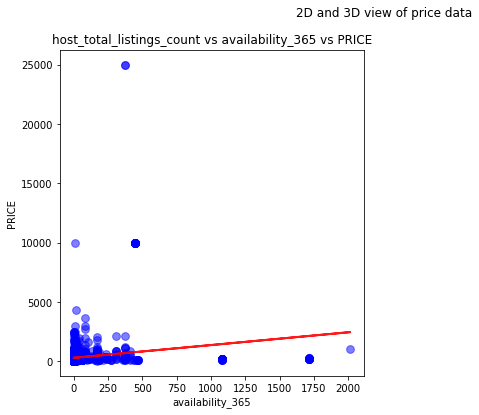

In [264]:
two_vs_three(X_test_slr[:,0],y_test_slr,y_pred_slr,None, True)

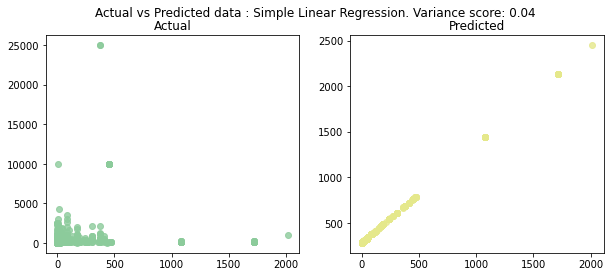

In [265]:
two_d_compare(X_test_slr,y_test_slr,y_pred_slr,model_name)

In [201]:
slrMetrics = model_metrics(slRegressor,y_test_slr,y_pred_slr)

Mean squared error: 1068161.82
R2 score: 0.04


## Build multiple linear regression model

In [202]:
combined = pd.read_csv("https://raw.githubusercontent.com/alex31425/GEOG594-MTHuang/master/combined.csv")
combined

,host_id,price,number_of_reviews,calculated_host_listings_count,availability_365,host_since_days,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,...,beds,avg_rm,availability_30,availability_60,availability_90,number_of_reviews_ltm,instant_bookable,NumberOfVerfication,govermentIdentification,numberofamentities
0,111468433,161,0,1,89,1396,f,1.0,t,f,...,1.0,1.000000,30,60,89,0,f,1,no,15
1,140139274,39,16,5,0,1217,f,5.0,t,f,...,1.0,1.000000,0,0,0,0,f,6,no,19
2,225508386,39,1,1,87,728,f,1.0,t,t,...,1.0,6.000000,0,0,0,1,t,6,yes,45
3,10213028,55,5,2,0,2544,f,2.0,t,t,...,1.0,1.000000,0,0,0,0,f,7,yes,41
4,10213028,55,8,2,0,2544,f,2.0,t,t,...,1.0,1.000000,0,0,0,0,f,7,yes,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12220,88168913,995,21,171,290,1560,t,173.0,t,t,...,4.0,3.666667,14,42,62,8,t,9,no,44
12221,344576481,995,1,9,342,202,f,9.0,t,f,...,12.0,7.666667,25,51,81,1,t,6,yes,36
12222,27899391,49,55,1,156,2095,t,2.0,t,f,...,1.0,1.000000,9,36,66,53,t,5,no,21
12223,83148223,55,172,1,21,1585,t,1.0,t,t,...,1.0,1.000000,0,0,21,38,f,5,no,29


In [203]:
#remove columns that are not required
combined = combined.drop(['host_id'], axis=1)
combined = combined.dropna()
combined.head()

,price,number_of_reviews,calculated_host_listings_count,availability_365,host_since_days,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,...,beds,avg_rm,availability_30,availability_60,availability_90,number_of_reviews_ltm,instant_bookable,NumberOfVerfication,govermentIdentification,numberofamentities
0,161,0,1,89,1396,f,1.0,t,f,2,...,1.0,1.0,30,60,89,0,f,1,no,15
1,39,16,5,0,1217,f,5.0,t,f,1,...,1.0,1.0,0,0,0,0,f,6,no,19
2,39,1,1,87,728,f,1.0,t,t,4,...,1.0,6.0,0,0,0,1,t,6,yes,45
3,55,5,2,0,2544,f,2.0,t,t,2,...,1.0,1.0,0,0,0,0,f,7,yes,41
4,55,8,2,0,2544,f,2.0,t,t,1,...,1.0,1.0,0,0,0,0,f,7,yes,40


In [204]:
combined.isnull().any()

price                             False
number_of_reviews                 False
calculated_host_listings_count    False
availability_365                  False
host_since_days                   False
host_is_superhost                 False
host_total_listings_count         False
host_has_profile_pic              False
host_identity_verified            False
accommodates                      False
bathrooms                         False
bedrooms                          False
beds                              False
avg_rm                            False
availability_30                   False
availability_60                   False
availability_90                   False
number_of_reviews_ltm             False
instant_bookable                  False
NumberOfVerfication               False
govermentIdentification           False
numberofamentities                False
dtype: bool

In [205]:
# Defining the categorical columns 
categoricalColumns = combined.select_dtypes(include=[np.object]).columns

print("Categorical columns : " )
print(categoricalColumns)

onehot_categorical =  OneHotEncoder(handle_unknown='ignore')

categorical_transformer = Pipeline(steps=[('onehot',onehot_categorical)])

Categorical columns : 
Index(['host_is_superhost', 'host_has_profile_pic', 'host_identity_verified',
       'instant_bookable', 'govermentIdentification'],
      dtype='object')


In [206]:
# Defining the numerical columns 
numericalColumns = [col for col in combined.select_dtypes(include=[np.int64]).columns if col not in ['price']]
print("Numerical columns : " )
print(numericalColumns)

scaler_numerical = StandardScaler()

numerical_transformer = Pipeline(steps=[('scale',scaler_numerical)])

Numerical columns : 
['number_of_reviews', 'calculated_host_listings_count', 'availability_365', 'host_since_days', 'accommodates', 'availability_30', 'availability_60', 'availability_90', 'number_of_reviews_ltm', 'NumberOfVerfication', 'numberofamentities']


In [207]:
preprocessorForCategoricalColumns = ColumnTransformer(transformers=[('cat', categorical_transformer, categoricalColumns)],
                                            remainder="passthrough")
preprocessorForAllColumns = ColumnTransformer(transformers=[('cat', categorical_transformer, categoricalColumns),('num',numerical_transformer,numericalColumns)],
                                            remainder="passthrough")


#. The transformation happens in the pipeline. Temporarily done here to show what intermediate value looks like
df_pd_temp = preprocessorForCategoricalColumns.fit_transform(combined)
print("Data after transforming :")
print(df_pd_temp)

df_pd_temp_2 = preprocessorForAllColumns.fit_transform(combined)
print("Data after transforming :")
print(df_pd_temp_2)

Data after transforming :
[[ 1.  0.  0. ...  0.  1. 15.]
 [ 1.  0.  0. ...  0.  6. 19.]
 [ 1.  0.  0. ...  1.  6. 45.]
 ...
 [ 0.  1.  0. ... 53.  5. 21.]
 [ 0.  1.  0. ... 38.  5. 29.]
 [ 0.  1.  0. ... 52.  3. 20.]]
Data after transforming :
[[1. 0. 0. ... 1. 1. 1.]
 [1. 0. 0. ... 1. 1. 1.]
 [1. 0. 0. ... 2. 1. 6.]
 ...
 [0. 1. 0. ... 1. 1. 1.]
 [0. 1. 0. ... 1. 1. 1.]
 [0. 1. 0. ... 1. 1. 1.]]


In [208]:
features = []
features = combined.drop(['price'], axis=1)

label = pd.DataFrame(combined, columns = ['price']) 
label_encoder = LabelEncoder()
label = combined['price']

label = label_encoder.fit_transform(label)
print(" value of label : " + str(label))

 value of label : [146  24  24 ...  34  40  45]


In [209]:
X_train, X_test, y_train, y_test = train_test_split(features,label , random_state=0)

print("Dimensions of datasets that will be used for training : Input features"+str(X_train.shape)+ 
      " Output label" + str(y_train.shape))
print("Dimensions of datasets that will be used for testing : Input features"+str(X_test.shape)+ 
      " Output label" + str(y_test.shape))

Dimensions of datasets that will be used for training : Input features(9112, 21) Output label(9112,)
Dimensions of datasets that will be used for testing : Input features(3038, 21) Output label(3038,)


In [210]:
from sklearn.linear_model import LinearRegression

model_name = 'Multiple Linear Regression'

mlRegressor = LinearRegression()

mlr_model = Pipeline(steps=[('preprocessorAll',preprocessorForAllColumns),('regressor', mlRegressor)])

mlr_model.fit(X_train,y_train)

y_pred_mlr= mlr_model.predict(X_test)

print(mlRegressor)

LinearRegression()


In [211]:
print('Intercept: \n',mlRegressor.intercept_)
print('Coefficients: \n', mlRegressor.coef_)

Intercept: 
 67.1655513974425
Coefficients: 
 [ 4.27955741e+01  3.55715023e+01  9.23182353e+00  4.13157729e+00
  5.74089813e+01  7.01343055e+01  2.87590008e+01  3.86646323e+01
 -8.24157575e+01 -8.62959244e+01 -8.93935347e+00  2.45115132e+01
  8.39624462e+00 -2.43120838e+00  6.03649696e+01  3.02900717e+00
  7.63515563e+00 -7.94470757e+00 -7.35744409e+00  3.23398441e+00
 -5.68090570e+00  1.32521412e-02  1.08714143e+09  1.08714146e+09
  1.08714143e+09 -3.26142428e+09]


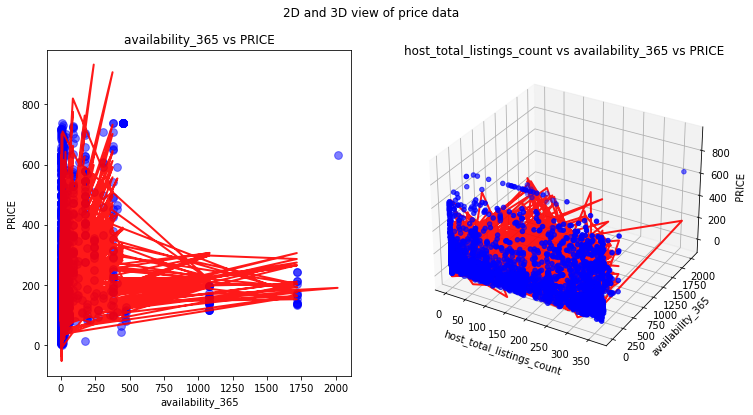

In [277]:
two_vs_three(X_test['host_total_listings_count'],y_test,y_pred_mlr,X_test['availability_365'], False)

In [212]:
mlrMetrics = model_metrics(slRegressor,y_test,y_pred_mlr)

Mean squared error: 12862.88
R2 score: 0.51


## Build Polynomial Linear regression model


The prediction line generated by simple/linear regression is usually a straight line. In cases when a simple or multiple linear regression does not fit the data point accurately, we use the polynomial linear regression. The following formula is used in the back-end to generate polynomial linear regression.

y = w0 + w1x1 + w2x21 + .... + wn*xnn

We are assuming that output depends on the availability_365 and host_total_listings_count. Data is split up into training and test sets.

In [213]:
features.head()

,number_of_reviews,calculated_host_listings_count,availability_365,host_since_days,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,accommodates,bathrooms,...,beds,avg_rm,availability_30,availability_60,availability_90,number_of_reviews_ltm,instant_bookable,NumberOfVerfication,govermentIdentification,numberofamentities
0,0,1,89,1396,f,1.0,t,f,2,1.0,...,1.0,1.0,30,60,89,0,f,1,no,15
1,16,5,0,1217,f,5.0,t,f,1,1.0,...,1.0,1.0,0,0,0,0,f,6,no,19
2,1,1,87,728,f,1.0,t,t,4,15.0,...,1.0,6.0,0,0,0,1,t,6,yes,45
3,5,2,0,2544,f,2.0,t,t,2,1.0,...,1.0,1.0,0,0,0,0,f,7,yes,41
4,8,2,0,2544,f,2.0,t,t,1,1.0,...,1.0,1.0,0,0,0,0,f,7,yes,40


In [214]:
X = features.iloc[:, [2,5]].values
X_train, X_test, y_train, y_test = train_test_split(X,label, random_state=0)

print("Dimensions of datasets that will be used for training : Input features"+str(X_train.shape)+ 
      " Output label" + str(y_train.shape))
print("Dimensions of datasets that will be used for testing : Input features"+str(X_test.shape)+ 
      " Output label" + str(y_test.shape))


Dimensions of datasets that will be used for training : Input features(9112, 2) Output label(9112,)
Dimensions of datasets that will be used for testing : Input features(3038, 2) Output label(3038,)


In [215]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures

model_name = 'Polynomial Linear Regression'

polynomial_features= PolynomialFeatures(degree=3)
plRegressor = LinearRegression()

plr_model = Pipeline(steps=[('polyFeature',polynomial_features ),('regressor', plRegressor)])

plr_model.fit(X_train,y_train)

y_pred_plr= plr_model.predict(X_test)

print(plRegressor)

LinearRegression()


In [216]:
print('Intercept: \n',plRegressor.intercept_)
print('Coefficients: \n', plRegressor.coef_)

Intercept: 
 147.93999323749458
Coefficients: 
 [ 0.00000000e+00 -2.89231095e-01  7.33953764e-01  4.42787149e-03
  6.73192337e-04 -7.63431248e-04 -9.30217239e-06 -5.67395433e-08
 -4.15681700e-07  1.80177217e-07]


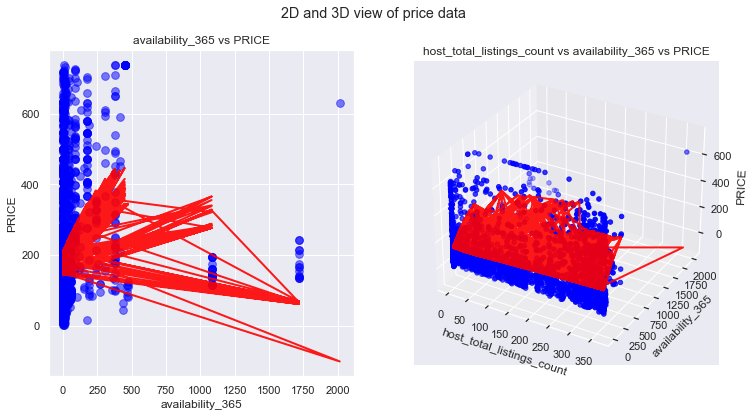

In [217]:
two_vs_three(X_test[:,1],y_test,y_pred_plr,X_test[:,0], False)

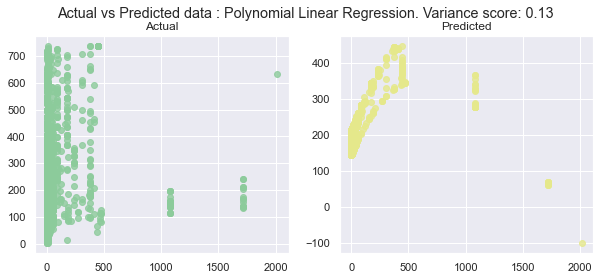

In [218]:
two_d_compare(X_test[:,1],y_test,y_pred_plr,model_name)

In [219]:
plrMetrics = model_metrics(plRegressor,y_test,y_pred_plr)

Mean squared error: 22752.51
R2 score: 0.13


## Build decision tree regressor

In [224]:
X_train, X_test, y_train, y_test = train_test_split(features,combined['price'] , random_state=0)

print("Dimensions of datasets that will be used for training : Input features"+str(X_train.shape)+ 
      " Output label" + str(y_train.shape))
print("Dimensions of datasets that will be used for testing : Input features"+str(X_test.shape)+ 
      " Output label" + str(y_test.shape))

Dimensions of datasets that will be used for training : Input features(9112, 21) Output label(9112,)
Dimensions of datasets that will be used for testing : Input features(3038, 21) Output label(3038,)


In [225]:
from sklearn.tree import DecisionTreeRegressor

model_name = "Decision Tree Regressor"

decisionTreeRegressor = DecisionTreeRegressor(random_state=0)

dtr_model = Pipeline(steps=[('preprocessorAll',preprocessorForAllColumns),('regressor', decisionTreeRegressor)]) 

dtr_model.fit(X_train,y_train)

y_pred_dtr = dtr_model.predict(X_test)

print(decisionTreeRegressor)

DecisionTreeRegressor(random_state=0)


In [222]:
export_graphviz(decisionTreeRegressor, out_file ='tree.dot')  
# Use dot file to create a graph
(graph, ) = pydot.graph_from_dot_file('tree.dot')
# Write graph to a png file
# graph.write_png('tree.png')

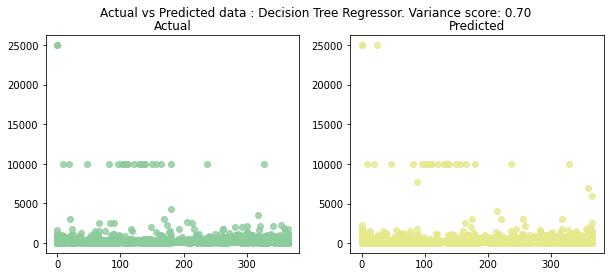

In [289]:
two_d_compare(X_test['availability_365'],y_test,y_pred_dtr,model_name)

In [226]:
dtrMetrics = model_metrics(decisionTreeRegressor,y_test,y_pred_dtr)

Mean squared error: 127233.87
R2 score: 0.89


## Build Random Forest classification model

In [227]:
from sklearn.ensemble import RandomForestRegressor

model_name = "Random Forest Regressor"

randomForestRegressor = RandomForestRegressor(n_estimators=100, max_depth=15,random_state=0)

rfr_model = Pipeline(steps=[('preprocessorAll',preprocessorForAllColumns),('regressor', randomForestRegressor)]) 

rfr_model.fit(X_train,y_train)

y_pred_rfr = rfr_model.predict(X_test)

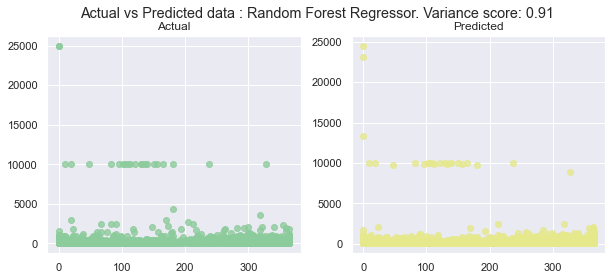

In [138]:
two_d_compare(X_test['availability_365'],y_test,y_pred_rfr,model_name)

In [228]:
rfrMetrics = model_metrics(randomForestRegressor,y_test,y_pred_rfr)

Mean squared error: 103556.35
R2 score: 0.91


## Build XGBoost model

In [235]:
model_name = "XGBoost"

xgboost = XGBRegressor(random_state=0)

xg_model = Pipeline(steps=[('preprocessorAll',preprocessorForAllColumns),('regressor', xgboost)])

xg_model.fit(X_train, y_train)

y_pred_xg = xg_model.predict(X_test)

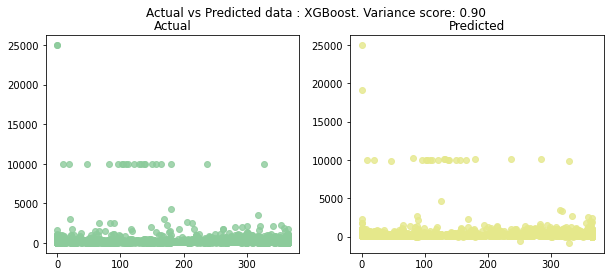

In [295]:
two_d_compare(X_test['availability_365'],y_test,y_pred_xg,model_name)

In [236]:
xgMetrics = model_metrics(xgboost,y_test,y_pred_xg)

Mean squared error: 107302.95
R2 score: 0.90


## Comparative study of different regression algorithms

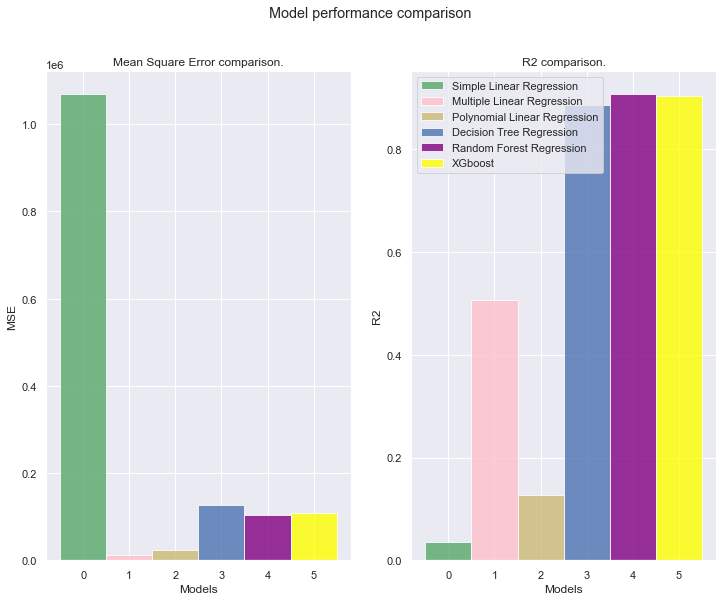

In [237]:
n_groups = 1
index = np.arange(n_groups)
bar_width = 0.5
opacity = 0.8


area = 70
plt.subplots(ncols=2, figsize=(12,9))
plt.suptitle('Model performance comparison')

plt.subplot(121)
index = np.arange(n_groups)
bar_width = 1
opacity = 0.8

rects1 = plt.bar(index, slrMetrics[0], bar_width,
alpha=opacity,
color='g',
label='Simple Linear Regression')

rects2 = plt.bar(index + bar_width, mlrMetrics[0], bar_width,
alpha=opacity,
color='pink',
label='Multiple Linear Regression')

rects3 = plt.bar(index + bar_width*2, plrMetrics[0], bar_width,
alpha=opacity,
color='y',
label='Polynomial Linear Regression')

rects4 = plt.bar(index + bar_width*3, dtrMetrics[0], bar_width,
alpha=opacity,
color='b',
label='Decision Tree Regression')


rects6 = plt.bar(index + bar_width*4, rfrMetrics[0], bar_width,
alpha=opacity,
color='purple',
label='Random Forest Regression')

rects7 = plt.bar(index + bar_width*5, xgMetrics[0], bar_width,
alpha=opacity,
color='yellow',
label='XGBoost')

plt.xlabel('Models')
plt.ylabel('MSE')
plt.title('Mean Square Error comparison.')
# ax.set_xticklabels(('', 'Simple Lin', 'Multiple Lin', 'Polynomial Lin', 'Decision Tree','Random Forest','XGboost'))

plt.subplot(122)

rects1 = plt.bar(index, slrMetrics[1], bar_width,
alpha=opacity,
color='g',
label='Simple Linear Regression')

rects2 = plt.bar(index + bar_width, mlrMetrics[1], bar_width,
alpha=opacity,
color='pink',
label='Multiple Linear Regression')

rects3 = plt.bar(index + bar_width*2, plrMetrics[1], bar_width,
alpha=opacity,
color='y',
label='Polynomial Linear Regression')

rects4 = plt.bar(index + bar_width*3, dtrMetrics[1], bar_width,
alpha=opacity,
color='b',
label='Decision Tree Regression')


rects6 = plt.bar(index + bar_width*4, rfrMetrics[1], bar_width,
alpha=opacity,
color='purple',
label='Random Forest Regression')

rects7 = plt.bar(index + bar_width*5, xgMetrics[1], bar_width,
alpha=opacity,
color='yellow',
label='XGboost')


plt.xlabel('Models')
plt.ylabel('R2')
plt.title('R2 comparison.')
# ax.set_xticklabels(('', 'Simple Lin', 'Multiple Lin', 'Polynomial Lin', 'Decision Tree','Random Forest','XGBoost'))



plt.legend()
plt.show()

## Feature importance

In [238]:
combined = pd.read_csv("https://raw.githubusercontent.com/alex31425/GEOG594-MTHuang/master/combined.csv")
combined.drop(['host_id'],axis=1,inplace=True)
combined = pd.get_dummies(combined, columns=objcolumn)
combined = combined.dropna()
df_combined = pd.DataFrame.from_records(combined.values)
X = df_combined.iloc[:, 1:].to_numpy()
y = df_combined.iloc[:, 0].to_numpy()


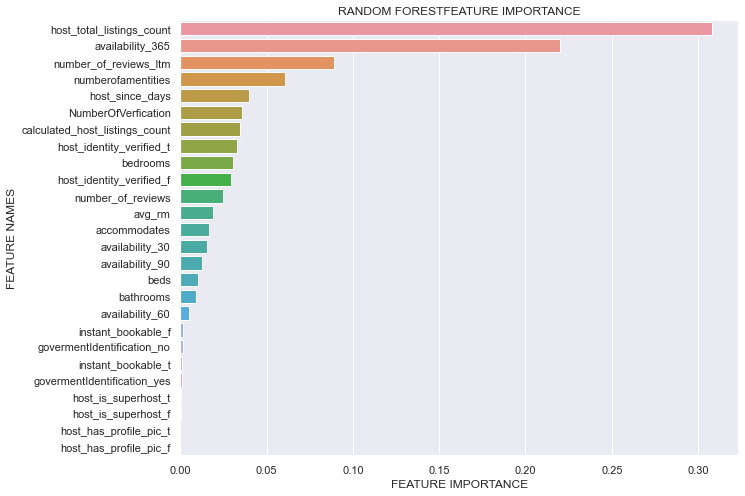

In [239]:
model_RFR = RandomForestRegressor()
importance_RFR = model_RFR.fit(X, y).feature_importances_

feature_rfr = []
score_rfr = []
for i, v in enumerate(importance_RFR):
    feature_rfr.append(f[i])
    score_rfr.append(round(v, 5))

plot_feature_importance(importance_RFR,f,'RANDOM FOREST')

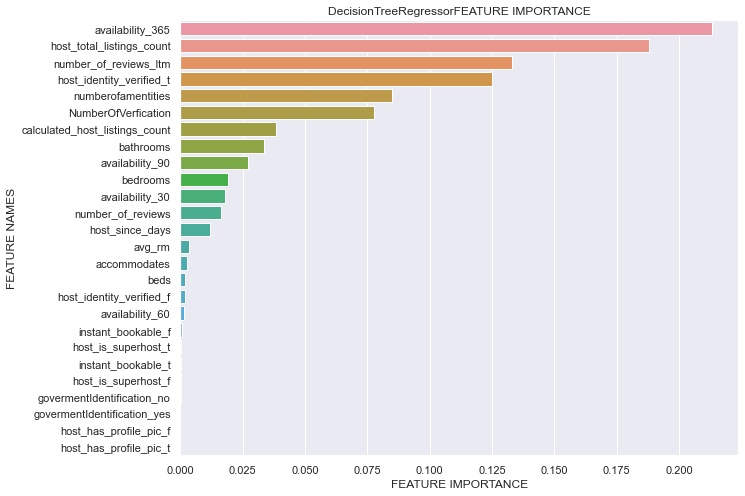

In [241]:
model_DTR = DecisionTreeRegressor()
importance_DTR = model_DTR.fit(X, y).feature_importances_

feature = []
score = []
for i, v in enumerate(importance_DTR):
    feature.append(f[i])
    score.append(round(v, 5))
plot_feature_importance(importance_DTR,f,'DecisionTreeRegressor')

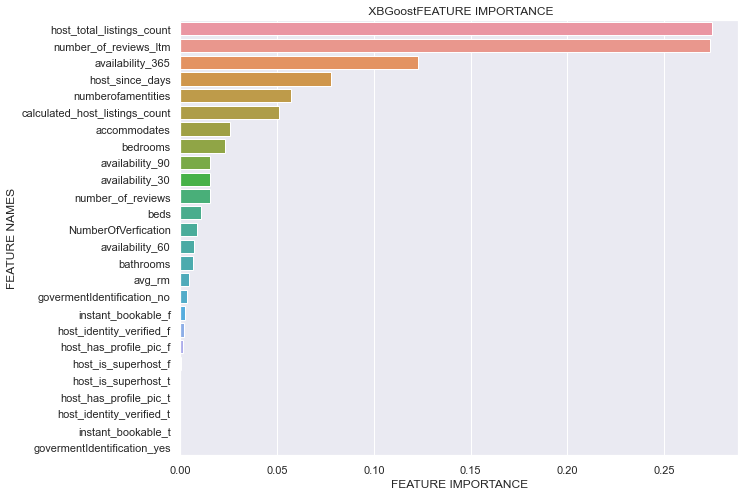

In [242]:
model_XGB = XGBRegressor()
importance_XBG = model_XGB.fit(X, y).feature_importances_

feature_xg = []
score_xg = []
for i, v in enumerate(importance_XBG):
    feature_xg.append(f[i])
    score_xg.append(round(v, 5))
plot_feature_importance(importance_XBG,f,' XBGoost')

In [243]:
df_ranking_vartype = pd.DataFrame({"Feature": pd.Series(feature)})
df_ranking_vartype = df_ranking_vartype.assign(Score_XGB = pd.Series(score_xg),Score_RFR = pd.Series(score_rfr))
df_ranking_vartype.sort_values(by=['Feature'])
df_ranking_vartype

,Feature,Score_XGB,Score_RFR
0,number_of_reviews,0.01529,0.02496
1,calculated_host_listings_count,0.05114,0.03483
2,availability_365,0.12265,0.21992
3,host_since_days,0.07808,0.03973
4,host_total_listings_count,0.27447,0.30783
5,accommodates,0.02559,0.01683
6,bathrooms,0.00684,0.00934
7,bedrooms,0.02339,0.03055
8,beds,0.01068,0.01027
9,avg_rm,0.00466,0.01889


In [303]:
criteria_2 = df_ranking_vartype['Score_XGB'] > 0.001
df_FS = df_ranking_vartype[criteria_2]
pd.Series(df_FS['Feature'])

0                  number_of_reviews
1     calculated_host_listings_count
2                   availability_365
3                    host_since_days
4          host_total_listings_count
5                       accommodates
6                          bathrooms
7                           bedrooms
8                               beds
9                             avg_rm
10                   availability_30
11                   availability_60
12                   availability_90
13             number_of_reviews_ltm
14               NumberOfVerfication
15                numberofamentities
18            host_has_profile_pic_f
20          host_identity_verified_f
22                instant_bookable_f
24        govermentIdentification_no
Name: Feature, dtype: object

## Variance Inflation Factor (VIF) 

In [288]:
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif 
X = df_con_d
X.columns

vif = [vif(X.values, i) for i in range(len(X.columns))] 

drop_col = []
for i,v in enumerate(vif):
    if v > 10:
        drop_col.append(X.columns[i])

drop_col


['accommodates',
 'bathrooms',
 'bedrooms',
 'beds',
 'avg_rm',
 'availability_30',
 'availability_60',
 'availability_90']

In [289]:
feature = []
score = []
for i, v in enumerate(vif):
    feature.append(f[i])
    score.append(round(v, 1))

pd.DataFrame(score,columns = ["VIF"],index=X.columns)

,VIF
Feature,
number_of_reviews,3.1
calculated_host_listings_count,1.8
availability_365,4.5
host_since_days,6.4
host_total_listings_count,1.4
accommodates,15.9
bathrooms,inf
bedrooms,inf
beds,inf


In [304]:
df_FS_M = combined[combined.columns & pd.Series(df_FS['Feature'])]
df_FS_M = df_FS_M.join(combined['price'])
#df_FS_M = combined.drop(columns = drop_col)

df_FS_M.dtypes

number_of_reviews                   int64
calculated_host_listings_count      int64
availability_365                    int64
host_since_days                     int64
host_total_listings_count         float64
accommodates                        int64
bathrooms                         float64
bedrooms                          float64
beds                              float64
avg_rm                            float64
availability_30                     int64
availability_60                     int64
availability_90                     int64
number_of_reviews_ltm               int64
NumberOfVerfication                 int64
numberofamentities                  int64
host_has_profile_pic_f              uint8
host_identity_verified_f            uint8
instant_bookable_f                  uint8
govermentIdentification_no          uint8
price                               int64
dtype: object

In [305]:
# Defining the categorical columns 
categoricalColumns = df_FS_M.select_dtypes(include=[np.object,np.uint8]).columns

print("Categorical columns : " )
print(categoricalColumns)

onehot_categorical =  OneHotEncoder(handle_unknown='ignore')

categorical_transformer = Pipeline(steps=[('onehot',onehot_categorical)])

Categorical columns : 
Index(['host_has_profile_pic_f', 'host_identity_verified_f',
       'instant_bookable_f', 'govermentIdentification_no'],
      dtype='object')


In [306]:
# Defining the numerical columns 
numericalColumns = [col for col in df_FS_M.select_dtypes(include=[np.int64,np.float64]).columns if col not in ['price']]
print("Numerical columns : " )
print(numericalColumns)

scaler_numerical = StandardScaler()

numerical_transformer = Pipeline(steps=[('scale',scaler_numerical)])

Numerical columns : 
['number_of_reviews', 'calculated_host_listings_count', 'availability_365', 'host_since_days', 'host_total_listings_count', 'accommodates', 'bathrooms', 'bedrooms', 'beds', 'avg_rm', 'availability_30', 'availability_60', 'availability_90', 'number_of_reviews_ltm', 'NumberOfVerfication', 'numberofamentities']


In [307]:
preprocessorForCategoricalColumns = ColumnTransformer(transformers=[('cat', categorical_transformer, categoricalColumns)],
                                            remainder="passthrough")
preprocessorForAllColumns = ColumnTransformer(transformers=[('cat', categorical_transformer, categoricalColumns),('num',numerical_transformer,numericalColumns)],
                                            remainder="passthrough")


In [308]:
features = []
features = df_FS_M.drop(['price'], axis=1)

label = pd.DataFrame(df_FS_M, columns = ['price']) 
label_encoder = LabelEncoder()
label = combined['price']

label = label_encoder.fit_transform(label)
print(" value of label : " + str(label))

 value of label : [146  24  24 ...  34  40  45]


In [309]:
X_train, X_test, y_train, y_test = train_test_split(features,label , random_state=0)

print("Dimensions of datasets that will be used for training : Input features"+str(X_train.shape)+ 
      " Output label" + str(y_train.shape))
print("Dimensions of datasets that will be used for testing : Input features"+str(X_test.shape)+ 
      " Output label" + str(y_test.shape))

Dimensions of datasets that will be used for training : Input features(9112, 20) Output label(9112,)
Dimensions of datasets that will be used for testing : Input features(3038, 20) Output label(3038,)


In [318]:
model_name = "XGBoost"

xgboost = XGBRegressor(random_state=0)

xg_model = Pipeline(steps=[('preprocessorAll',preprocessorForAllColumns),('regressor', xgboost)])

xg_model.fit(X_train, y_train)

y_pred_xg = xg_model.predict(X_test)

In [297]:
xgMetrics_AV = model_metrics(xgboost,y_test,y_pred_xg)

Mean squared error: 16210.23
R2 score: 0.38


In [319]:
xgMetrics_AXG = model_metrics(xgboost,y_test,y_pred_xg)

Mean squared error: 8713.62
R2 score: 0.67


In [320]:
from sklearn.ensemble import RandomForestRegressor

model_name = "Random Forest Regressor"

randomForestRegressor = RandomForestRegressor(n_estimators=100, max_depth=15,random_state=0)

rfr_model = Pipeline(steps=[('preprocessorAll',preprocessorForAllColumns),('regressor', randomForestRegressor)]) 

rfr_model.fit(X_train,y_train)

y_pred_rfr = rfr_model.predict(X_test)

In [299]:
rfrMetrics_AV = model_metrics(randomForestRegressor,y_test,y_pred_rfr)

Mean squared error: 15712.44
R2 score: 0.40


In [321]:
rfrMetrics_AXG = model_metrics(randomForestRegressor,y_test,y_pred_rfr)

Mean squared error: 8977.30
R2 score: 0.66


In [326]:
from sklearn.linear_model import LinearRegression

model_name = 'Multiple Linear Regression'

mlRegressor = LinearRegression()

mlr_model = Pipeline(steps=[('preprocessorAll',preprocessorForAllColumns),('regressor', mlRegressor)])

mlr_model.fit(X_train,y_train)

y_pred_mlr= mlr_model.predict(X_test)

print(mlRegressor)

LinearRegression()


In [301]:
mlrMetrics_AV = model_metrics(slRegressor,y_test,y_pred_mlr)

Mean squared error: 21140.37
R2 score: 0.19


In [327]:
mlrMetrics_AXG = model_metrics(slRegressor,y_test,y_pred_mlr)

Mean squared error: 12888.01
R2 score: 0.51


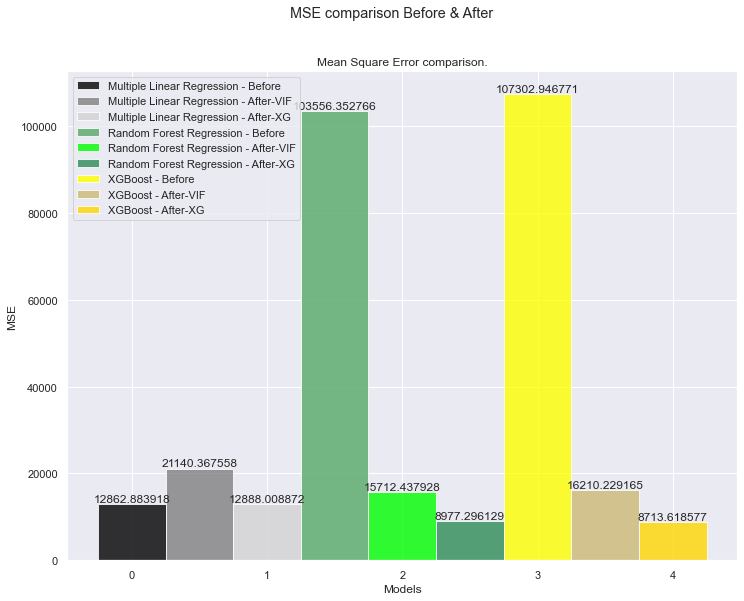

In [317]:
n_groups = 1
index = np.arange(n_groups)
bar_width = 0.5
opacity = 0.8



area = 70
fig, ax = plt.subplots(ncols=1, figsize=(12,9))
plt.suptitle('MSE comparison Before & After')

# plt.subplot(121)
# index = np.arange(n_groups)
# bar_width = 1
# opacity = 0.8


rects1 = plt.bar(index, mlrMetrics[0], bar_width,
alpha=opacity,
color='black',
label='Multiple Linear Regression - Before')

rects2 = plt.bar(index + bar_width, mlrMetrics_AV[0], bar_width,
alpha=opacity,
color='gray',
label='Multiple Linear Regression - After-VIF')

rects3 = plt.bar(index + bar_width*2, mlrMetrics_AXG[0], bar_width,
alpha=opacity,
color='lightgray',
label='Multiple Linear Regression - After-XG')

rects4 = plt.bar(index + bar_width*3, rfrMetrics[0], bar_width,
alpha=opacity,
color='g',
label='Random Forest Regression - Before')

rects5 = plt.bar(index + bar_width*4, rfrMetrics_AV[0], bar_width,
alpha=opacity,
color='lime',
label='Random Forest Regression - After-VIF')

rects6 = plt.bar(index + bar_width*5, rfrMetrics_AXG[0], bar_width,
alpha=opacity,
color='seagreen',
label='Random Forest Regression - After-XG')

rects7 = plt.bar(index + bar_width*6, xgMetrics[0], bar_width,
alpha=opacity,
color='yellow',
label='XGBoost - Before')


rects8 = plt.bar(index + bar_width*7, xgMetrics_AV[0], bar_width,
alpha=opacity,
color='y',
label='XGBoost - After-VIF')

rects9 = plt.bar(index + bar_width*8, xgMetrics_AXG[0], bar_width,
alpha=opacity,
color='gold',
label='XGBoost - After-XG')

plt.xlabel('Models')
plt.ylabel('MSE')
plt.title('Mean Square Error comparison.')
# ax.set_xticklabels(('Simple Lin', 'Simple Lin', 'Multiple Lin', 'Polynomial Lin', 'Decision Tree','Random Forest'))

def autolabel(rects):
    """
    Attach a text label above each bar displaying its height
    """
    for rect in rects:
        height = rect.get_height()
        ax.text(rect.get_x() + rect.get_width()/2., 1.0*height,
                '%f' % float(height),
        ha='center', va='bottom')
        
autolabel(rects1)
autolabel(rects2)
autolabel(rects3)
autolabel(rects4)
autolabel(rects5)
autolabel(rects6)
autolabel(rects7)
autolabel(rects8)
autolabel(rects9)

plt.legend()
plt.show()